In [8]:
from struct import unpack
import numpy as np
import matplotlib.pylab as plt
import gzip
import scipy as sp
from scipy import ndimage
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [2]:
def loadmnist(imagefile, labelfile):

    # Open the images with gzip in read binary mode
    images = gzip.open(imagefile, 'rb')
    labels = gzip.open(labelfile, 'rb')

    # Get metadata for images
    images.read(4)  # skip the magic_number
    number_of_images = images.read(4)
    number_of_images = unpack('>I', number_of_images)[0]
    rows = images.read(4)
    rows = unpack('>I', rows)[0]
    cols = images.read(4)
    cols = unpack('>I', cols)[0]

    # Get metadata for labels
    labels.read(4)
    N = labels.read(4)
    N = unpack('>I', N)[0]

    # Get data
    x = np.zeros((N, rows*cols), dtype=np.uint8)  # Initialize numpy array
    y = np.zeros(N, dtype=np.uint8)  # Initialize numpy array
    for i in range(N):
        for j in range(rows*cols):
            tmp_pixel = images.read(1)  # Just a single byte
            tmp_pixel = unpack('>B', tmp_pixel)[0]
            x[i][j] = tmp_pixel
        tmp_label = labels.read(1)
        y[i] = unpack('>B', tmp_label)[0]

    images.close()
    labels.close()
    return (x, y)

In [3]:
def displaychar(image):
    plt.imshow(np.reshape(image, (28,28)), cmap=plt.cm.gray)
    plt.axis('off')
    plt.show()

In [4]:
x,y = loadmnist('train-images-idx3-ubyte.gz','train-labels-idx1-ubyte.gz')

In [5]:
x.shape,y.shape


((60000, 784), (60000,))

In [9]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [11]:
x_train.shape,x_test.shape

((48000, 784), (12000, 784))

### Step 1 - mean centering using standard scaler as PCA is scale sensitive

In [12]:
scale = StandardScaler()
x_train = scale.fit_transform(x_train)
x_test = scale.transform(x_test)

### Step 2 - apply PCA to reduce dimensions

In [13]:
pca = PCA(n_components = 150)
x_train_trans = pca.fit_transform(x_train)
x_test_trans = pca.transform(x_test)

In [14]:
x_train_trans.shape,x_test_trans.shape

((48000, 150), (12000, 150))

### Step 3 - Apply classifier algorithm to predict

In [15]:
knn = KNeighborsClassifier()
knn.fit(x_train_trans,y_train)
y_pred = knn.predict(x_test_trans)
accuracy_score(y_test,y_pred)

C:\Users\arsal\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


0.9574166666666667

### Step 4 - visualization in 2D and 3D

In [18]:
import plotly.express as px

In [17]:
pca = PCA(n_components = 2)
x_train_2d = pca.fit_transform(x_train)
x_test_2d = pca.transform(x_test)

x_train_2d

array([[ -0.0425051 ,  -1.91921139],
       [  8.15971023,  -4.49579941],
       [ -7.5049928 ,  -3.71975159],
       ...,
       [ 10.27733403,  -9.28617296],
       [ 10.29726345, -12.41326571],
       [ -2.87742503,  -0.81175529]])

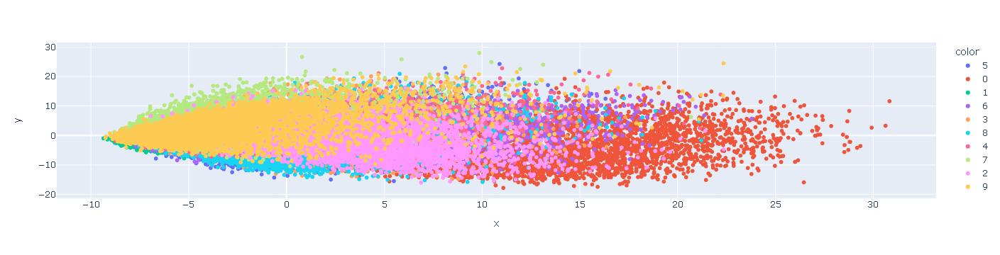

In [21]:
y_train_trans = y_train.astype(str)
fig = px.scatter(x=x_train_2d[:,0],
                 y=x_train_2d[:,1],
                 color=y_train_trans)
fig.show()

In [22]:
pca = PCA(n_components = 3)
x_train_3d = pca.fit_transform(x_train)
x_test_3d = pca.transform(x_test)

x_train_3d

array([[ -0.04276476,  -1.92328776,  -2.50244043],
       [  8.15958086,  -4.49626352,  -4.74324519],
       [ -7.50486111,  -3.71934417,   5.13634769],
       ...,
       [ 10.27726861,  -9.28589773,  -1.82665453],
       [ 10.29731416, -12.4130441 ,   3.29411203],
       [ -2.87750009,  -0.81123618,  -1.44760103]])

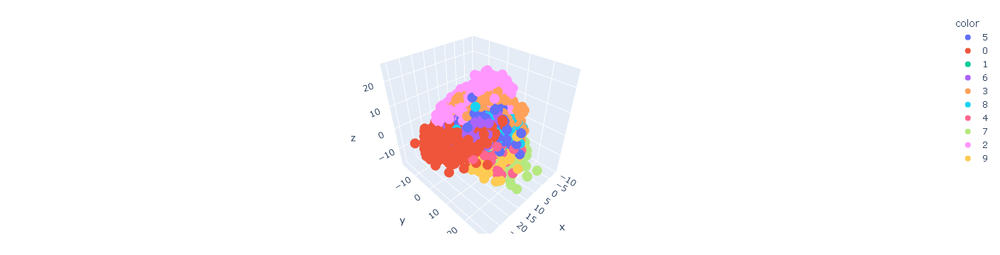

In [30]:

fig = px.scatter_3d(x=x_train_3d[:,0],
                     y=x_train_3d[:,1],
                     z = x_train_3d[:,2],
                 color=y_train_trans)
fig.update_layout(margin=dict(l=30, r=30, t=20, b=30))
fig.show()

### Check eigen vectors and eigen values

In [32]:
pca.components_,pca.components_.shape #3 eigen vectors for 3dim ,each vector is 784 dimensional

(array([[ 6.48650639e-19, -1.30321628e-18,  1.80900266e-19, ...,
         -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
        [ 5.85030089e-17,  5.45598104e-18,  3.69397419e-18, ...,
         -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
        [ 2.00313591e-16,  4.12706430e-17, -1.62791902e-17, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]),
 (3, 784))

In [33]:
pca.explained_variance_ #eigen values

array([40.65780534, 29.35286681, 26.72542314])

### Step 5 - find optimal no. of components which explain atleast 90% of data's variance

In [35]:
pca = PCA(n_components=None)
x_train_trans = pca.fit_transform(x_train)
x_test_trans = pca.transform(x_test)
pca.explained_variance_.shape , pca.components_.shape

((784,), (784, 784))

#### check % of variance explained by each eigen vector or principal component

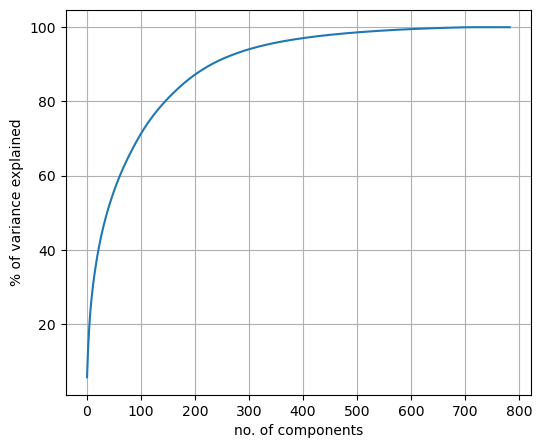

In [45]:
np.cumsum(pca.explained_variance_ratio_)*100
plt.rcParams['figure.figsize'] = 6,5
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100)
plt.xlabel('no. of components')
plt.ylabel('% of variance explained')
plt.grid(visible=True)

In [47]:
pca = PCA(n_components=250)
x_train_trans = pca.fit_transform(x_train)
x_test_trans = pca.transform(x_test)

knn = KNeighborsClassifier()
knn.fit(x_train_trans,y_train)
y_pred = knn.predict(x_test_trans)
accuracy_score(y_test,y_pred)

C:\Users\arsal\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



0.951